# Création d'un dataset d'ordre de lecture sur PubLayNet

In [1]:
# !pip install Unidecode
# !pip install fuzzysearch

# !pip install elementpath
# !pip install lxml 
# !pip install graphviz
# !pip install pydotplus

In [2]:
!ls ../../../edspdf-train/data/publaynet/

dev.json			test	       train	       xmls
oa_file_list.ARTgjjvC.csv.part	test_urls.txt  train_urls.txt  xmls-bis


In [3]:
import sys
sys.path.append('../')
import os
from pathlib import Path
import json
from sort_xml import *
import numpy as np
import pickle as pk

from edspdf import Pipeline
from edspdf.structures import Box, PDFDoc


base_dir = '../../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

sys.executable

'/export/home/smbaye/edspdf-train/.venv/bin/python'

### Load pdf and xml names and info

In [4]:
xmls_dir = base_dir + 'train/'
dev_path = base_dir + 'dev.json'

with open(Path(dev_path)) as f:
    samples = json.load(f)

# load xml files
xmls_names = {} # {pmc = {xml_fname, pdf_fname}}
for root, directories, files in os.walk(xmls_dir):
    for pmc in directories:
        fdir = xmls_dir + pmc
        for root2, directories2, files2 in os.walk(fdir):
            xml_fname = None
            pdfs_fnames = []
            for file in files2:
                if file.split('.')[-1] == 'nxml':
                    xml_fname = file
                if file.split('.')[-1] == 'pdf':
                    pdfs_fnames.append(file)

            lenghts = [len(pf) for pf in pdfs_fnames]
            # if len(lenghts) == 0:
            #   print(f'fdir ==> {fdir}')

            i_min = np.argmin(lenghts)
            xmls_names[pmc] = {'xml' :xml_fname, 'pdf': pdfs_fnames[i_min], 'page_num': None}
    break
# end load xml files
    
    
for image in samples['images']:
    pmc = image['file_name'].split('_')[0]
    if pmc in xmls_names:
        page_num = int(image['file_name'].split('_')[1].split('.')[0])
        xmls_names[pmc]['page_num'] = page_num


In [5]:
print(f'Nb pmc {len(xmls_names)}')
for k,v in xmls_names.items():
    print(f'k: {k} -> v: {v}')
    break

Nb pmc 800
k: PMC3001219 -> v: {'xml': 'CN-8-268.nxml', 'pdf': 'CN-8-268.pdf', 'page_num': 0}


In [6]:
# model
model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

In [7]:
import subprocess
import re

# Commande à exécuter
command = 'ls ../../../edspdf-train/data/publaynet/train'  # Cette commande liste les fichiers dans le répertoire courant (sur Unix/Linux/Mac)

# Exécution de la commande
process = subprocess.run(command, shell=True, capture_output=True, text=True, encoding='utf-8', errors='ignore')

# Récupération et affichage de la sortie
pmcs = process.stdout
pmcs = re.sub(r'\x1b\[.*?m', '', pmcs).splitlines()

print("Standard Output:")
n1, n2 = 600, 700
print(pmcs[n1:n2])
print(len(pmcs[n1:n2]))

Standard Output:
['PMC3018621', 'PMC3018626', 'PMC3018628', 'PMC3018643', 'PMC3018652', 'PMC3020327', 'PMC3021852', 'PMC3021860', 'PMC3021871', 'PMC3022163', 'PMC3022167', 'PMC3022172', 'PMC3022179', 'PMC3022203', 'PMC3022208', 'PMC3022552', 'PMC3022846', 'PMC3025364', 'PMC3025382', 'PMC3025383', 'PMC3026981', 'PMC3026987', 'PMC3033105', 'PMC3033106', 'PMC3033108', 'PMC3033109', 'PMC3033110', 'PMC3033125', 'PMC3033126', 'PMC3033127', 'PMC3033133', 'PMC3033135', 'PMC3033140', 'PMC3033142', 'PMC3033143', 'PMC3033150', 'PMC3033152', 'PMC3033159', 'PMC3033160', 'PMC3033161', 'PMC3033165', 'PMC3033167', 'PMC3033170', 'PMC3033171', 'PMC3033173', 'PMC3033174', 'PMC3033177', 'PMC3033517', 'PMC3034705', 'PMC3034922', 'PMC3034924', 'PMC3034945', 'PMC3034981', 'PMC3034992', 'PMC3034994', 'PMC3038324', 'PMC3038413', 'PMC3038612', 'PMC3039553', 'PMC3042604', 'PMC3042610', 'PMC3042618', 'PMC3042624', 'PMC3042643', 'PMC3042666', 'PMC3042671', 'PMC3042978', 'PMC3042979', 'PMC3044095', 'PMC3045361', 'P

In [8]:
# OK 1-2

# PMC3018628  -->  3/100
for it,pmc in enumerate(pmcs[n1:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3018621  -->  1/100
body nodes 34/34
front nodes 4/5

------------------------
PMC3018626  -->  2/100
table 0 nodes 1/2
table 1 nodes 1/2
table 2 nodes 1/2
table 3 nodes 1/2
table 4 nodes 1/2
table 5 nodes 48/49
body nodes 28/33
front nodes 3/5

------------------------
PMC3018628  -->  3/100
table 0 nodes 33/38
table 1 nodes 26/38
table 2 nodes 0/48
table 3 nodes 54/54
table 4 nodes 10/10


KeyboardInterrupt: 

In [ ]:
# OK 4-27

# PMC3033125  -->  28/100
for it,pmc in enumerate(pmcs[n1+3:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+3}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3018643  -->  4/100
table 0 nodes 18/20
table 1 nodes 29/29
table 2 nodes 20/20
table 3 nodes 34/34
table 4 nodes 6/6
body nodes 40/43
front nodes 4/5

------------------------
PMC3018652  -->  5/100
table 0 nodes 14/15
body nodes 49/49
front nodes 4/5

------------------------
PMC3020327  -->  6/100
table 0 nodes 7/8
table 1 nodes 30/30
table 2 nodes 31/31
table 3 nodes 4/21
body nodes 40/49
front nodes 4/5

------------------------
PMC3021852  -->  7/100
table 0 nodes 15/23
table 1 nodes 18/27
body nodes 23/25
front nodes 4/5

------------------------
PMC3021860  -->  8/100
body nodes 20/20
front nodes 3/5

------------------------
PMC3021871  -->  9/100
body nodes 28/28
front nodes 3/5

------------------------
PMC3022163  -->  10/100
table 0 nodes 22/22
table 1 nodes 9/9
table 2 nodes 10/11
table 3 nodes 8/8
body nodes 9/9
front nodes 4/5

------------------------
PMC3022167  -->  11/100
body nodes 20/20
front nodes 3/5

------------------------
PMC3022

In [10]:
# OK 29-32

# PMC3033140  -->  33/100 KO get front nodes
for it,pmc in enumerate(pmcs[n1+28:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+28}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3033126  -->  29/100
table 0 nodes 13/13
table 1 nodes 7/7
table 2 nodes 5/5
table 3 nodes 5/5
table 4 nodes 1/2
table 5 nodes 3/3
table 6 nodes 2/2
body nodes 38/44
front nodes 3/5

------------------------
PMC3033127  -->  30/100
table 0 nodes 5/5
body nodes 57/67
front nodes 2/5

------------------------
PMC3033133  -->  31/100
table 0 nodes 5/10
body nodes 45/51
front nodes 2/5

------------------------
PMC3033135  -->  32/100
body nodes 22/27
front nodes 4/5

------------------------
PMC3033140  -->  33/100
table 0 nodes 9/9
table 1 nodes 6/6
table 2 nodes 4/7
body nodes 29/42


IndexError: list index out of range

In [11]:
# OK 34-38

# PMC3033160  -->  39/100 KO get front nodes
for it,pmc in enumerate(pmcs[n1+33:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+33}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3033142  -->  34/100
table 0 nodes 4/4
table 1 nodes 5/5
table 2 nodes 5/6
body nodes 1/7
front nodes 1/5

------------------------
PMC3033143  -->  35/100
table 0 nodes 10/10
table 1 nodes 14/14
table 2 nodes 11/11
table 3 nodes 7/7
body nodes 11/16
front nodes 5/8

------------------------
PMC3033150  -->  36/100
table 0 nodes 11/11
table 1 nodes 9/10
table 2 nodes 8/12
table 3 nodes 21/23
table 4 nodes 11/11
table 5 nodes 10/11
table 6 nodes 21/23
body nodes 37/47
front nodes 1/5

------------------------
PMC3033152  -->  37/100
body nodes 31/38
front nodes 1/5

------------------------
PMC3033159  -->  38/100
table 0 nodes 2/19
body nodes 15/31
front nodes 5/5

------------------------
PMC3033160  -->  39/100
table 0 nodes 2/5
table 1 nodes 10/10
table 2 nodes 14/14
table 3 nodes 11/11
table 4 nodes 8/25
table 5 nodes 6/6
table 6 nodes 8/8
body nodes 34/41


IndexError: list index out of range

In [12]:
# OK 40-57

# PMC3038612  -->  58/100
for it,pmc in enumerate(pmcs[n1+39:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+39}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3033161  -->  40/100
table 0 nodes 6/6
table 1 nodes 3/3
table 2 nodes 8/8
body nodes 19/29
front nodes 2/5

------------------------
PMC3033165  -->  41/100
table 0 nodes 18/20
table 1 nodes 18/18
table 2 nodes 18/18
body nodes 16/30
front nodes 2/5

------------------------
PMC3033167  -->  42/100
table 0 nodes 25/25
table 1 nodes 8/8
table 2 nodes 9/9
body nodes 26/36
front nodes 0/5

------------------------
PMC3033170  -->  43/100
table 0 nodes 14/14
table 1 nodes 14/14
table 2 nodes 8/8
body nodes 53/66
front nodes 2/5

------------------------
PMC3033171  -->  44/100
table 0 nodes 13/14
table 1 nodes 3/8
body nodes 21/29
front nodes 3/5

------------------------
PMC3033173  -->  45/100
body nodes 15/29
front nodes 2/5

------------------------
PMC3033174  -->  46/100
table 0 nodes 4/4
table 1 nodes 9/9
table 2 nodes 11/11
table 3 nodes 29/33
body nodes 31/39
front nodes 1/5

------------------------
PMC3033177  -->  47/100
table 0 nodes 5/6
body node

KeyboardInterrupt: 

In [13]:
# OK 59-66

# PMC3042978  -->  67/100
for it,pmc in enumerate(pmcs[n1+58:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+58}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3039553  -->  59/100
table 0 nodes 30/53
table 1 nodes 33/33
table 2 nodes 13/13
body nodes 31/49
front nodes 6/7

------------------------
PMC3042604  -->  60/100
table 0 nodes 6/6
table 1 nodes 7/7
body nodes 34/34
front nodes 3/5

------------------------
PMC3042610  -->  61/100
table 0 nodes 9/10
table 1 nodes 19/31
table 2 nodes 20/20
body nodes 17/25
front nodes 4/5

------------------------
PMC3042618  -->  62/100
table 0 nodes 8/11
table 1 nodes 6/6
table 2 nodes 5/9
table 3 nodes 7/8
body nodes 21/24
front nodes 3/5

------------------------
PMC3042624  -->  63/100
table 0 nodes 9/9
table 1 nodes 11/13
table 2 nodes 5/7
body nodes 32/34
front nodes 3/5

------------------------
PMC3042643  -->  64/100
table 0 nodes 11/15
body nodes 18/20
front nodes 3/5

------------------------
PMC3042666  -->  65/100
table 0 nodes 0/38
table 1 nodes 1/16
table 2 nodes 0/23
table 3 nodes 0/21
table 4 nodes 0/26
body nodes 0/40
front nodes 0/5

--------------------

KeyboardInterrupt: 

In [15]:
# OK 68-89c

# PMC3056147  -->  90/100
for it,pmc in enumerate(pmcs[n1+67:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+67}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3042979  -->  68/100
body nodes 76/76
front nodes 2/4

------------------------
PMC3044095  -->  69/100
table 0 nodes 26/26
table 1 nodes 24/25
table 2 nodes 10/34
table 3 nodes 5/6
body nodes 36/48
front nodes 1/7

------------------------
PMC3045361  -->  70/100
body nodes 70/72
front nodes 3/4

------------------------
PMC3045365  -->  71/100
table 0 nodes 7/8
body nodes 16/20
front nodes 6/7

------------------------
PMC3045982  -->  72/100
table 0 nodes 16/16
table 1 nodes 9/10
body nodes 44/51
front nodes 1/7

------------------------
PMC3049152  -->  73/100
table 0 nodes 36/36
body nodes 71/74
front nodes 4/5

------------------------
PMC3051265  -->  74/100
table 0 nodes 19/19
table 1 nodes 6/6
body nodes 21/28
front nodes 4/5

------------------------
PMC3051888  -->  75/100
table 0 nodes 9/10
table 1 nodes 29/30
body nodes 26/36
front nodes 7/8

------------------------
PMC3055251  -->  76/100
table 0 nodes 7/7
body nodes 59/62
front nodes 3/4

--

KeyboardInterrupt: 

In [16]:
# OK 91

# PMC3058135  -->  92/100
for it,pmc in enumerate(pmcs[n1+90:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+90}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3058133  -->  91/100
table 0 nodes 1/1
table 1 nodes 1/1
table 2 nodes 1/1
body nodes 32/38
front nodes 3/5

------------------------
PMC3058135  -->  92/100


KeyboardInterrupt: 

In [17]:
# OK 93-97

# PMC3064997  -->  98/100
for it,pmc in enumerate(pmcs[n1+92:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+92}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3062076  -->  93/100
table 0 nodes 6/6
table 1 nodes 8/8
table 2 nodes 16/19
body nodes 15/16
front nodes 4/5

------------------------
PMC3062096  -->  94/100
table 0 nodes 9/14
table 1 nodes 11/23
body nodes 19/19
front nodes 3/5

------------------------
PMC3062098  -->  95/100
table 0 nodes 12/15
table 1 nodes 6/7
table 2 nodes 13/13
table 3 nodes 11/11
table 4 nodes 9/9
body nodes 25/25
front nodes 4/5

------------------------
PMC3062102  -->  96/100
body nodes 7/7
front nodes 4/5

------------------------
PMC3064996  -->  97/100
table 0 nodes 17/19
table 1 nodes 21/23
table 2 nodes 15/15
body nodes 25/26
front nodes 3/5

------------------------
PMC3064997  -->  98/100
table 0 nodes 1/2
table 1 nodes 6/6
table 2 nodes 3/10


KeyboardInterrupt: 

In [18]:
# OK 99-100

# PMC3064997  -->  98/100
for it,pmc in enumerate(pmcs[n1+98:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+98}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3065054  -->  99/100
body nodes 21/21
front nodes 4/5

------------------------
PMC3065662  -->  100/100
body nodes 75/75
front nodes 3/5


NOT OK:
- PMC3018628  -->  3/100
- PMC3033125  -->  28/100
- PMC3033140  -->  33/100 KO get front nodes
- PMC3033160  -->  39/100 KO get front nodes
- PMC3038612  -->  58/100
- PMC3042978  -->  67/100
- PMC3056147  -->  90/100
- PMC3058135  -->  92/100
- PMC3064997  -->  98/100

In [19]:
# OK 33,39
l_it_pmc = [(32, pmcs[n1+32]), (38, pmcs[n1+38]), (91, pmcs[n1+91]), (97, pmcs[n1+97]),(57, pmcs[n1+57]), \
            (66, pmcs[n1+66]), (89, pmcs[n1+89]), (2, pmcs[n1+2]),(27, pmcs[n1+27])]
for it,pmc in l_it_pmc:
    print(f'\n------------------------\n{pmc}  -->  {1+it}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3033140  -->  33/100
table 0 nodes 9/9
table 1 nodes 6/6
table 2 nodes 4/7
body nodes 29/42
front nodes 1/4

------------------------
PMC3033160  -->  39/100
table 0 nodes 2/5
table 1 nodes 10/10
table 2 nodes 14/14
table 3 nodes 11/11
table 4 nodes 8/25
table 5 nodes 6/6
table 6 nodes 8/8
body nodes 34/41
front nodes 4/4

------------------------
PMC3058135  -->  92/100


KeyboardInterrupt: 

xml path: ../../../edspdf-train/data/publaynet/train/PMC3058135/humu0032-0002.nxml
pdf path: ../../../edspdf-train/data/publaynet/train/PMC3058135/humu0032-0002.pdf


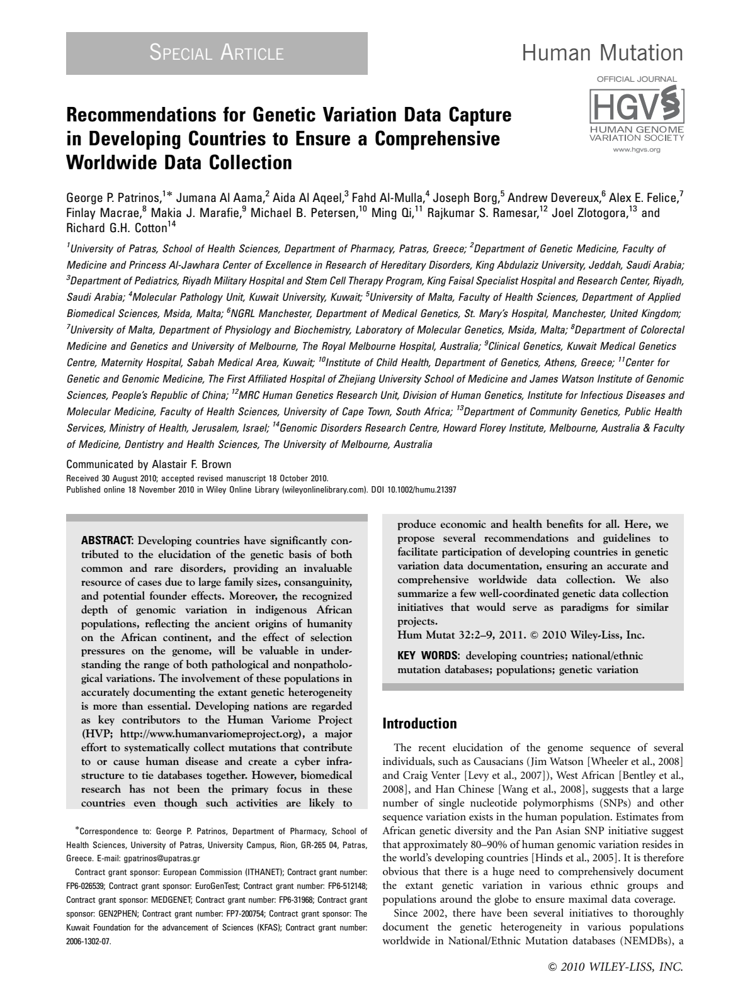

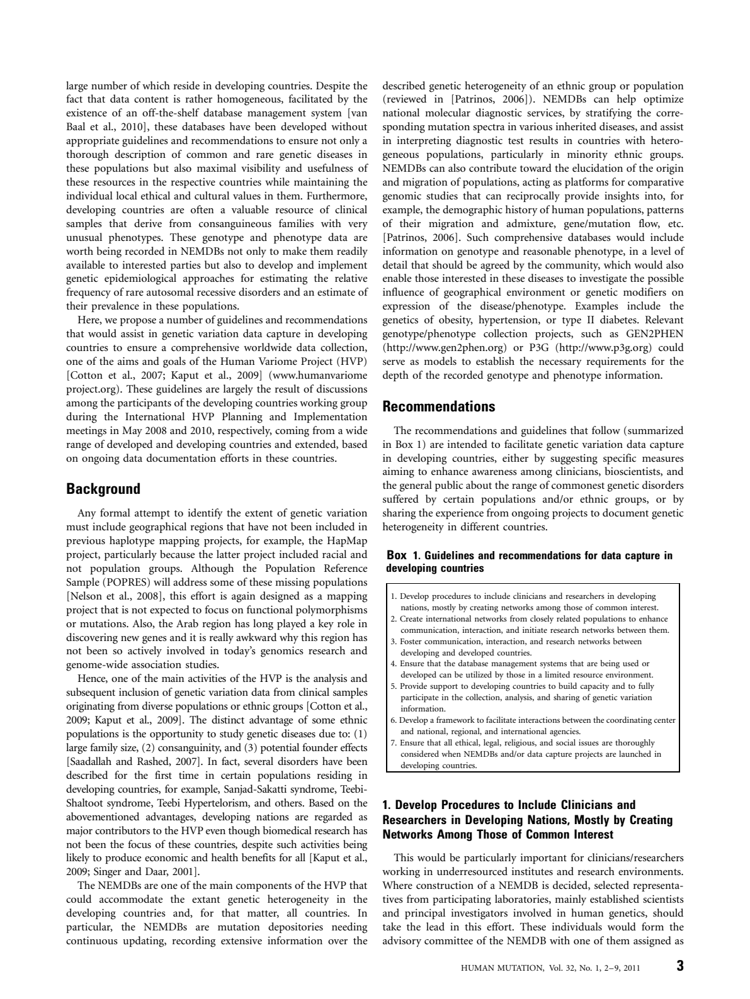

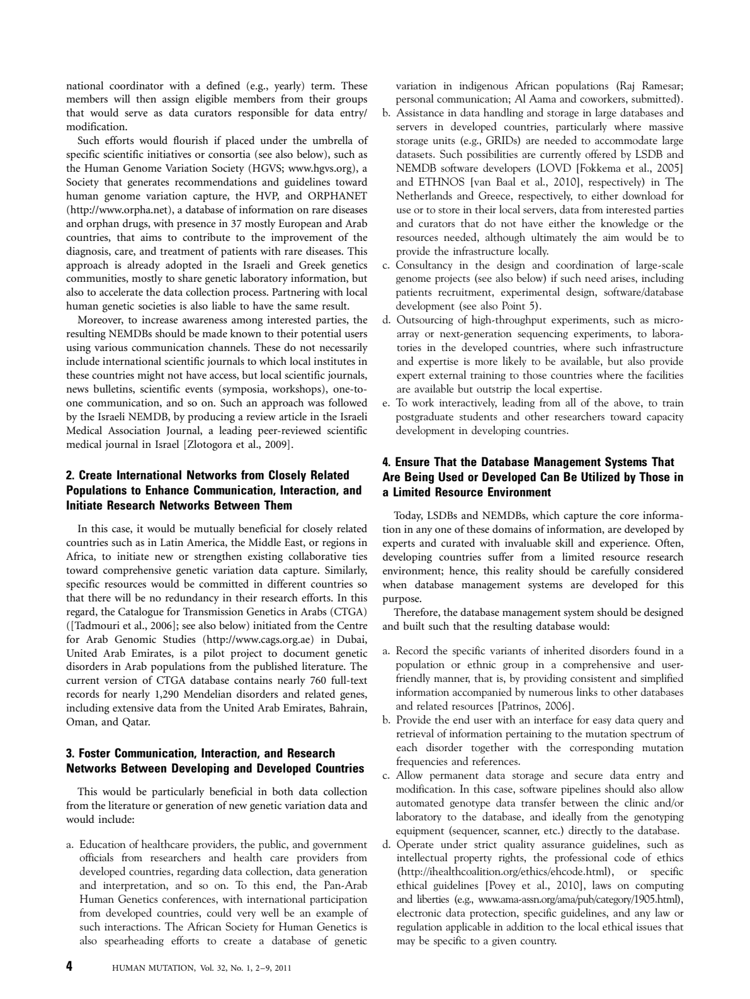

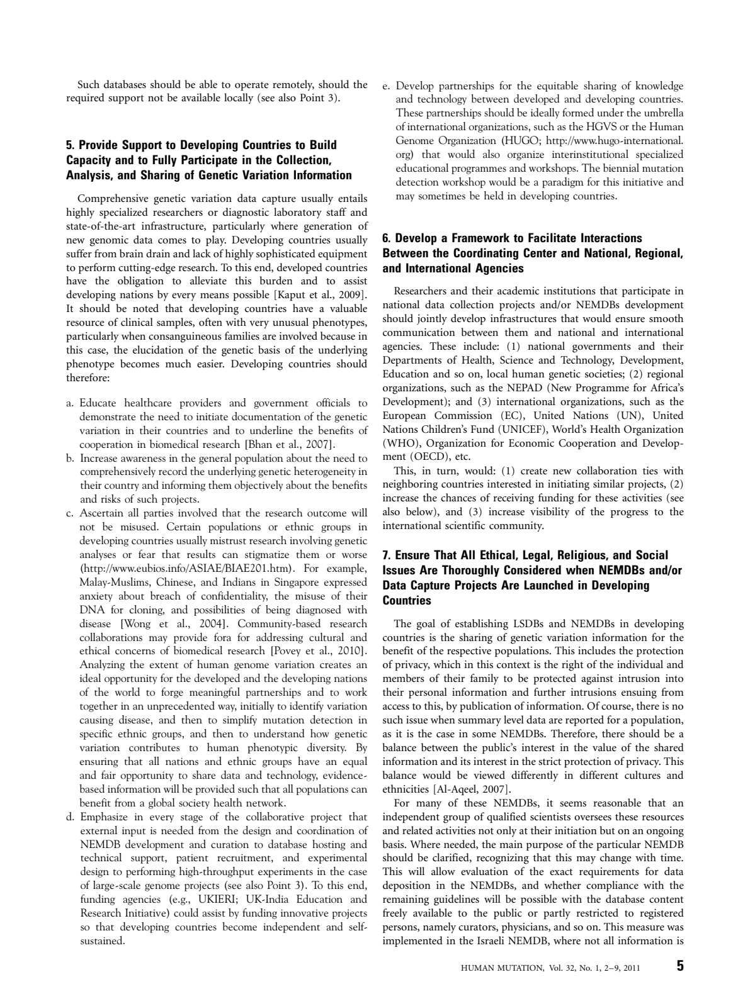

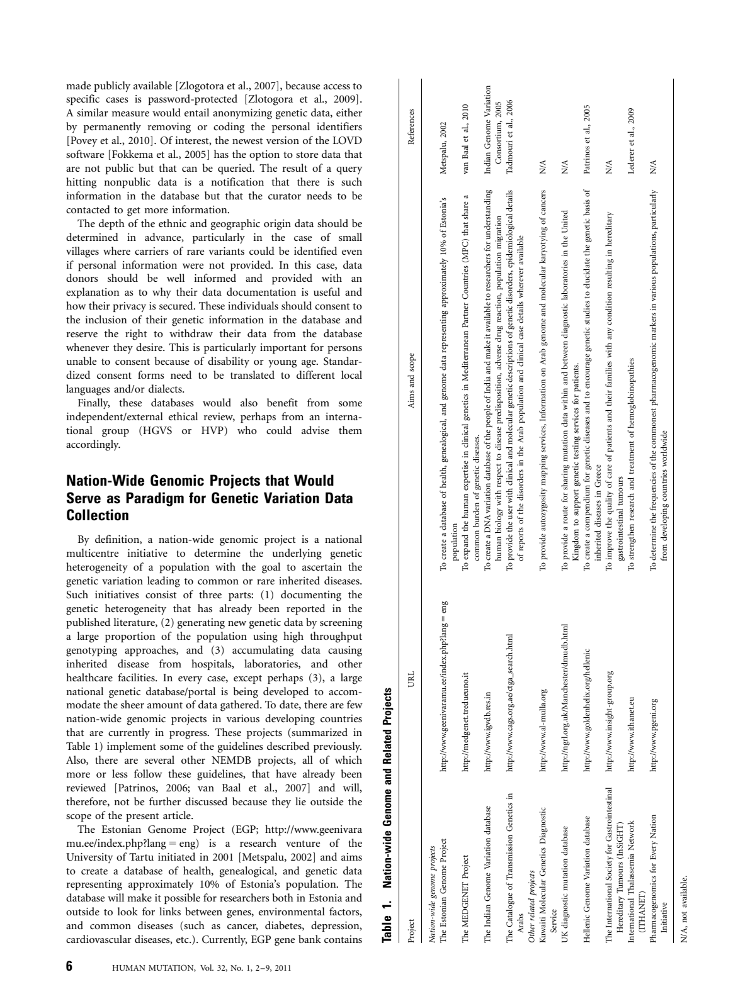

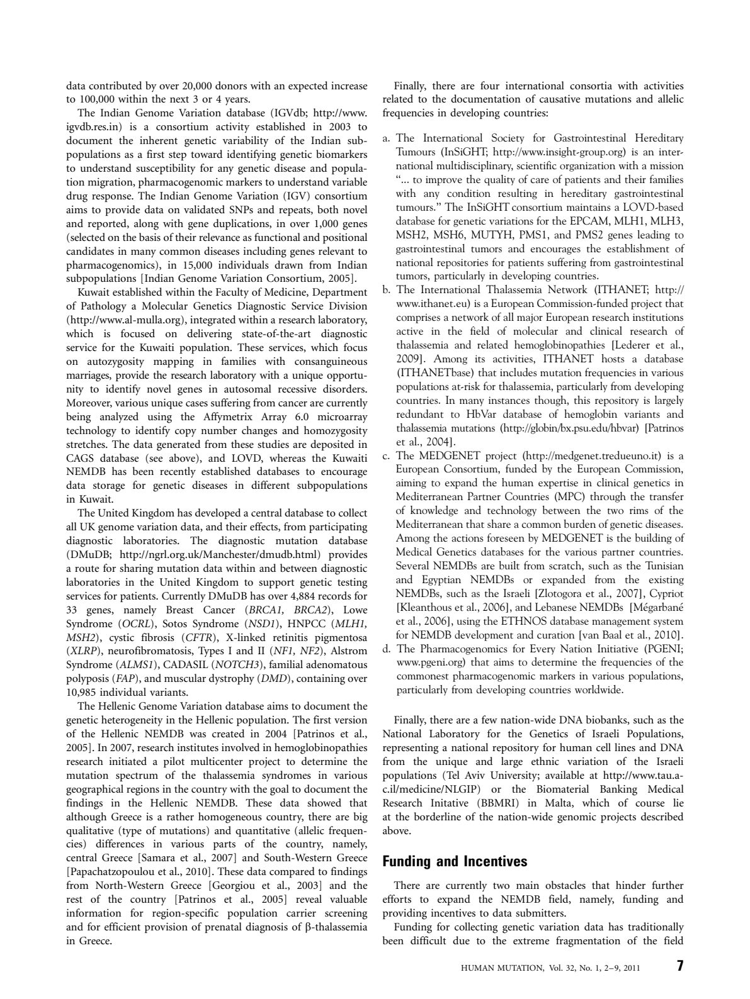

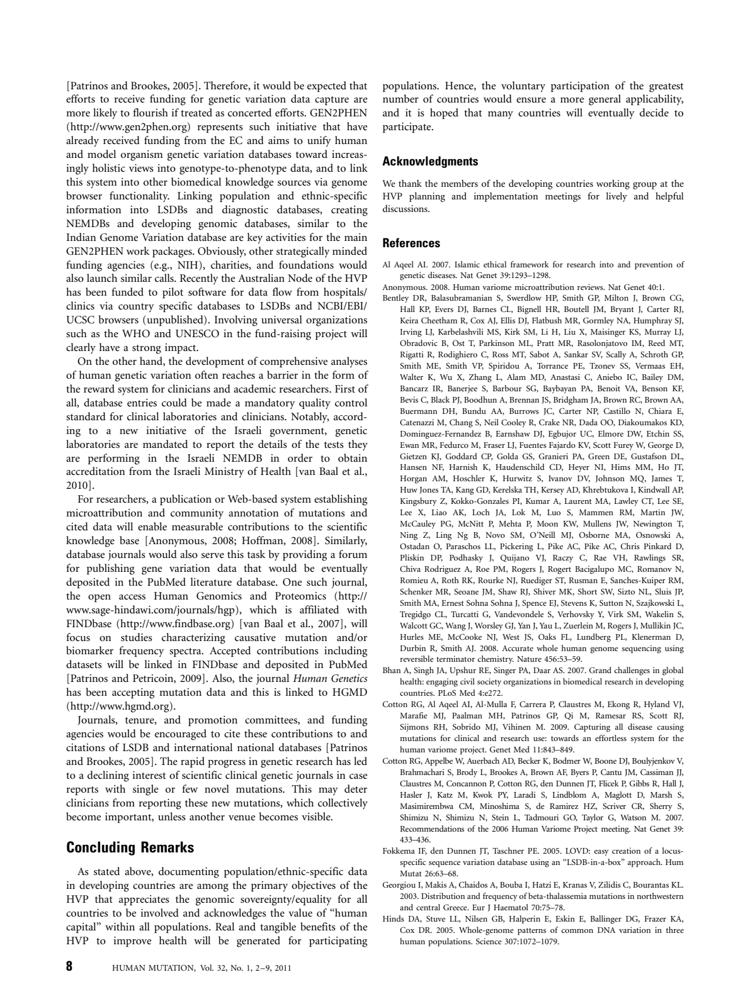

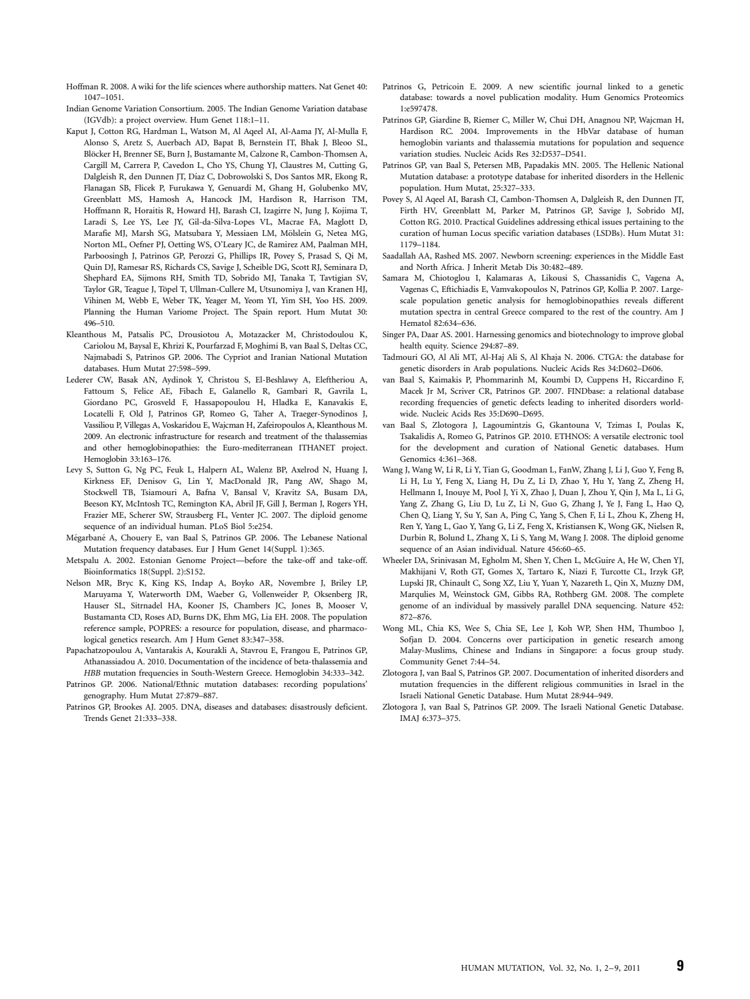

In [20]:
file_dir = '../../../edspdf-train/data/publaynet/train/PMC3058135'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')

pdf = Path(pdf_path).read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

for page in show_annotations(doc.content, []):
    display(page)

In [82]:
with open(pk_path, 'rb') as file:
    loaded_pmc_data = pk.load(file)

## Display pdf(show annotation) with the loaded pkl file

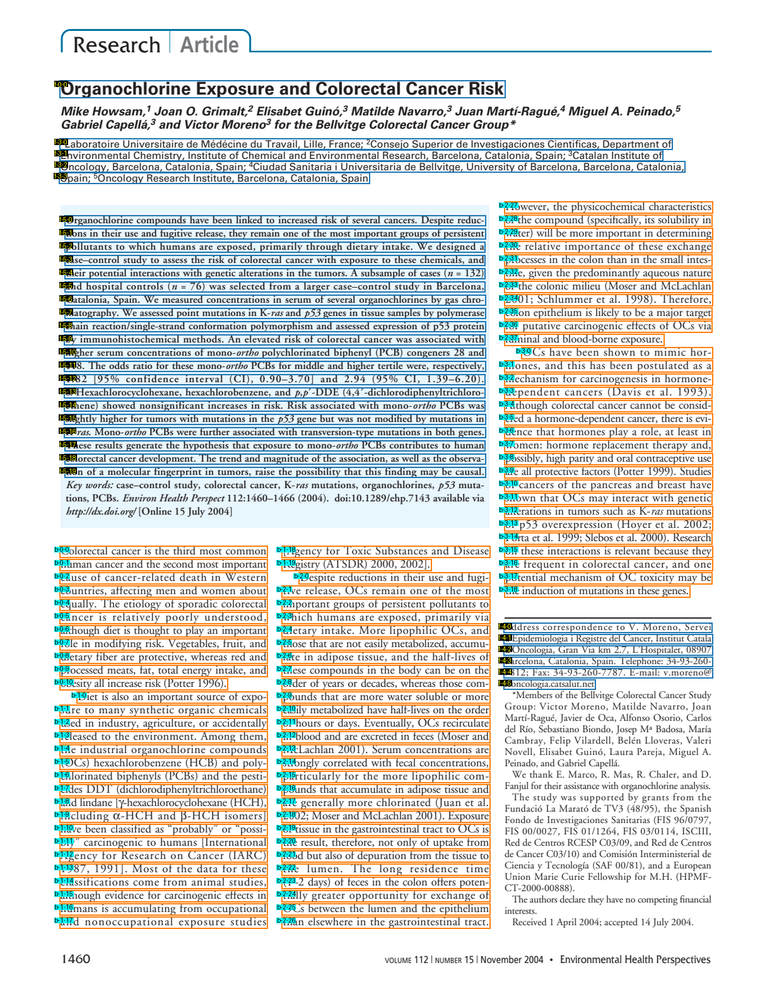

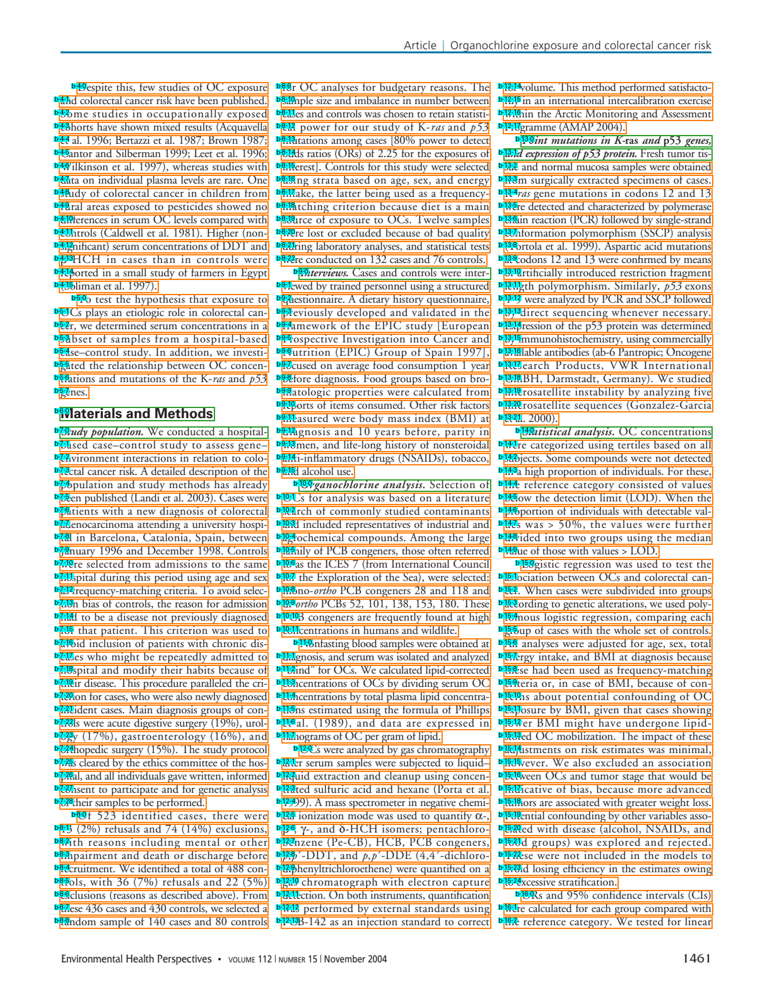

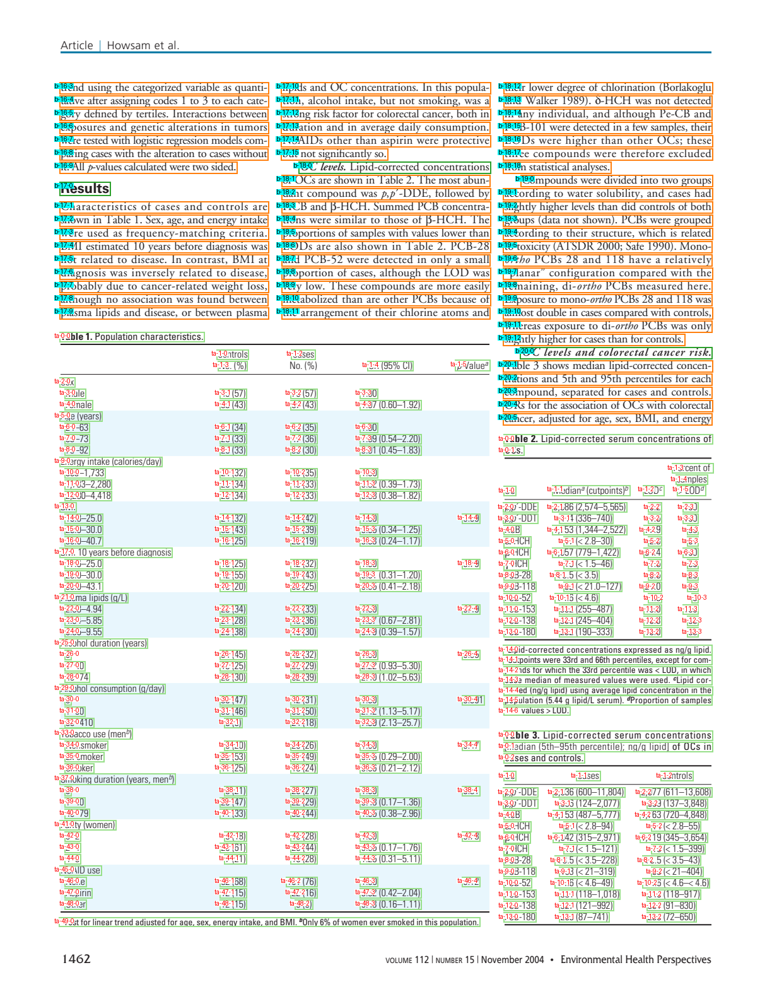

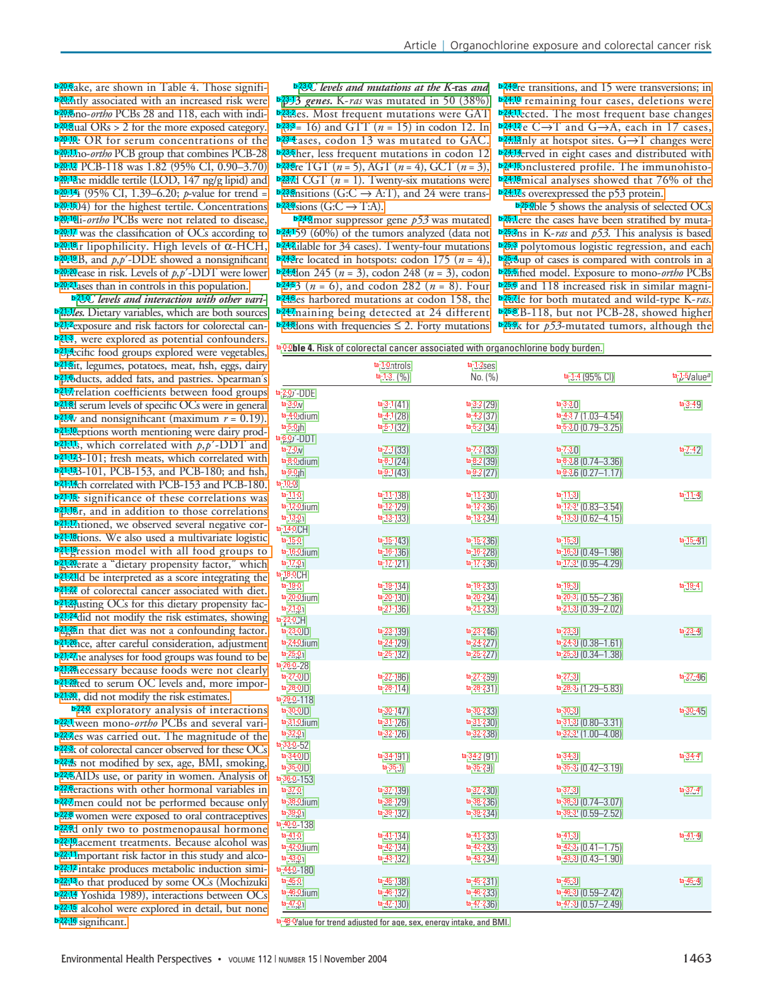

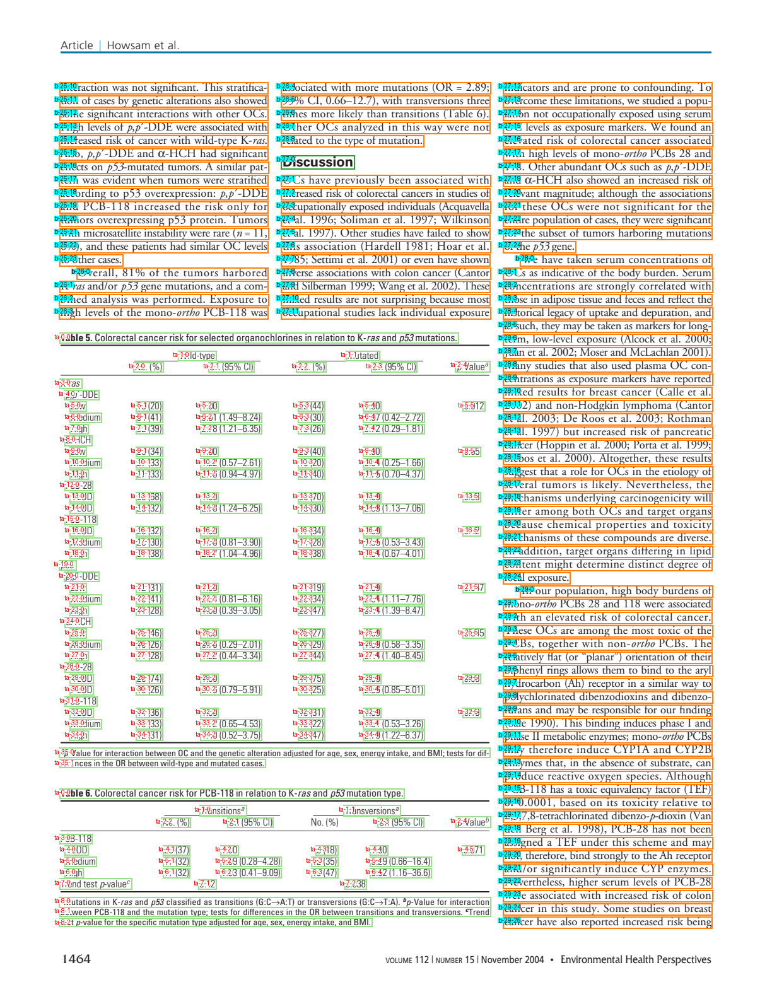

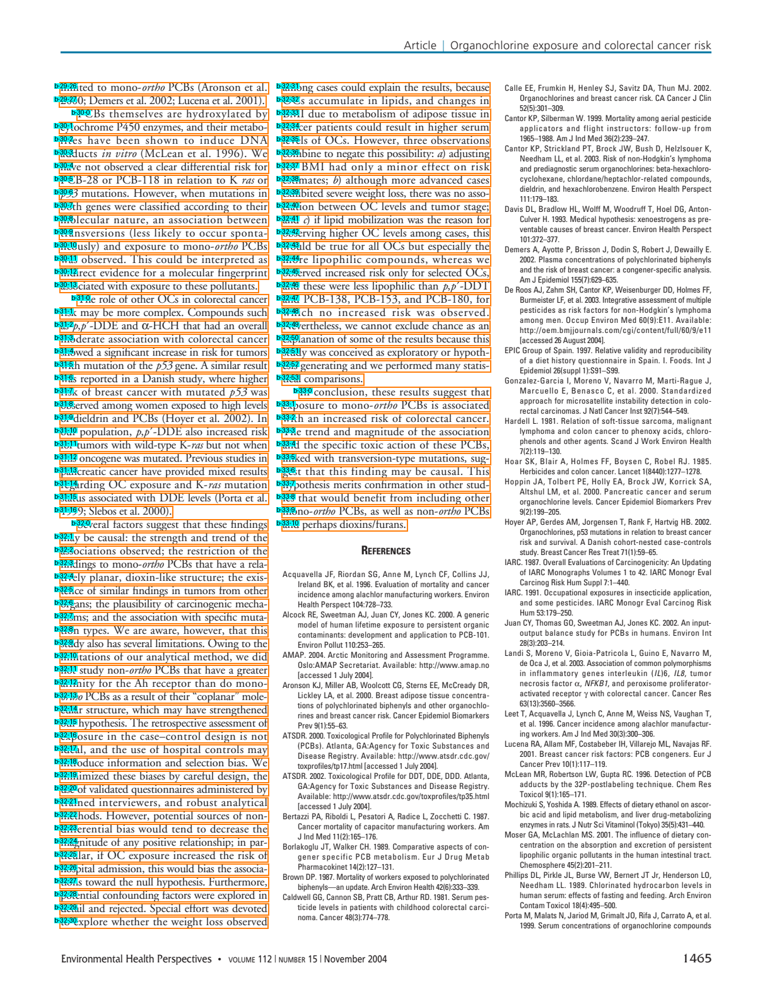

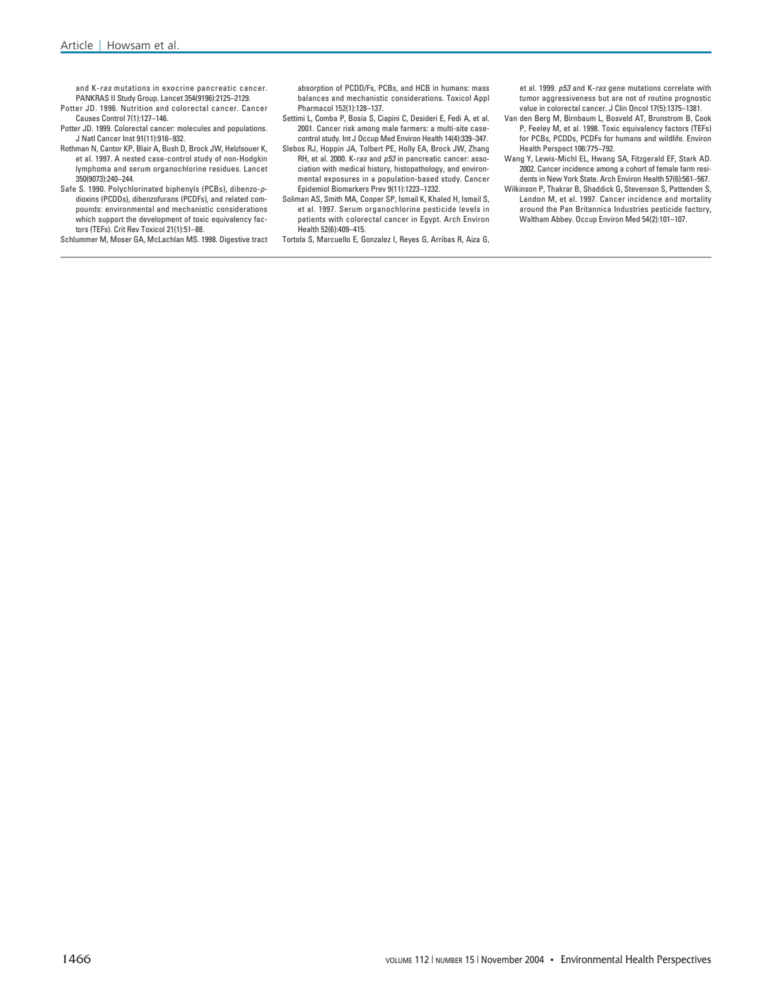

In [95]:
from edspdf.structures import Box, Box_lines, TextBox

pdf = Path(loaded_pmc_data['pdf_path']).read_bytes()
doc_2: PDFDoc = model.get_pipe("extractor")(pdf)

content_boxes = []
for li in loaded_pmc_data['front_lines'] + loaded_pmc_data['body_lines'] + loaded_pmc_data['table_lines']:
    _tb = TextBox(
        x0=li['x0'],
        x1=li['x1'],
        y0=li['y0'],
        y1=li['y1'],
        text=li['text'],
        label=li['label'],
        page_num=li['page_num'],
        )
    if li['node_type'] == 'front':
        _tb.rank = f"{li['node_type'][0]}-{li['node_num']}-{li['rank']}"
        _tb.color='yellow'
        _tb.bg_color='black'
    if li['node_type'] == 'body':
        _tb.rank = f"{li['node_type'][0]}-{li['node_num']}-{li['rank']}"
        _tb.color='black'
        _tb.bg_color='cyan'
    if li['node_type'] == 'table':
        _tb.rank = f"{li['node_type'][:2]}-{li['node_num']}-{li['rank']}"
        _tb.color='red'
        _tb.bg_color='white'
    content_boxes.append(_tb)

for page in show_annotations(doc_2.content, content_boxes):
    display(page)